## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy
import scipy.sparse.linalg

# modify to where you store your project data including utils.py
datadir = "/Users/salinatedcoffee/Documents/CS 445/HW3/jpark165_proj3/" 

utilfn = datadir + "utils.py"
!cp "$utilfn" .
samplesfn = datadir + "samples"
!cp -r "$samplesfn" .
import utils

cp: ./utils.py and /Users/salinatedcoffee/Documents/CS 445/HW3/jpark165_proj3/utils.py are identical (not copied).
cp: ./samples and /Users/salinatedcoffee/Documents/CS 445/HW3/jpark165_proj3/samples are identical (not copied).


## Part 1 Toy Problem (20 pts)

In [36]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example.
    Reconstruct this image from its gradient values, plus one pixel intensity.
    Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y).
    For each pixel, then, we have two objectives:
        1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
        2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
        3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    
    height, width = img.shape
    im2var = np.arange(height * width).reshape((height, width))
    neq = 2 * height * width
    A = scipy.sparse.lil_matrix((neq, height * width), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    e = 0
    
    # Objective 3
    A[e, im2var[0][0]] = 1
    b[e] = img[0][0]
    
    for y in range(height):
        for x in range(width):
            if x != width-1:
                # Objective 1
                e = e + 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = img[y][x+1] - img[y][x]
            if y != height-1:
                # Objective 2
                e = e + 1
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = img[y+1][x] - img[y][x]
    
    v = scipy.sparse.linalg.lsqr(A, b)
    
    return v[0].reshape(height, width)

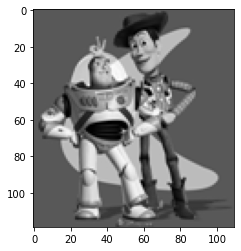

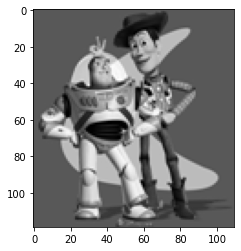

Max error is:  8.073677333630958e-06


In [37]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

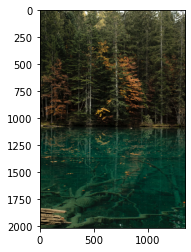

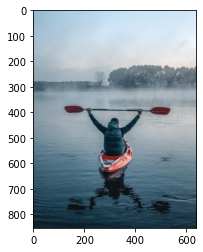

In [294]:
background_img = cv2.cvtColor(cv2.imread('samples/pb_bg1.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
scale_h, scale_w = background_img.shape[:2]
scale_h = int(scale_h * 0.7)
scale_w = int(scale_w * 0.7)
background_img = cv2.resize(background_img, (scale_w, scale_h))
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/pb_obj1.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = True  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (65, 359, 359, 65)
  ys = (24, 24, 457, 457)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (1000, 2500) # (x,y)

  #object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


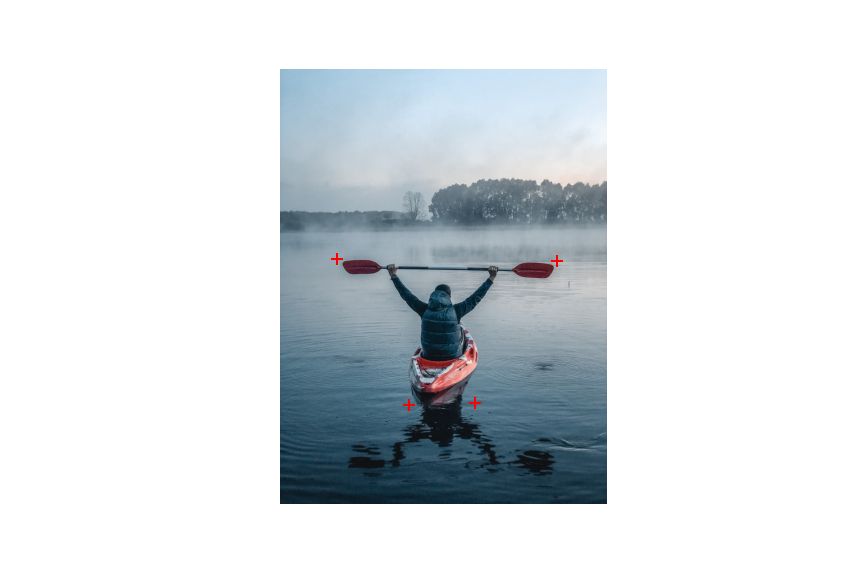

In [295]:
if use_interface:
    import matplotlib.pyplot as plt
    %matplotlib notebook
    mask_coords = utils.specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

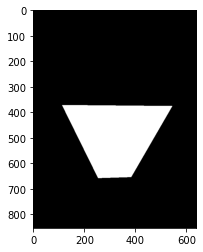

In [296]:
if use_interface:
    xs = mask_coords[0]
    ys = mask_coords[1]
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.figure()
    object_mask = utils.get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


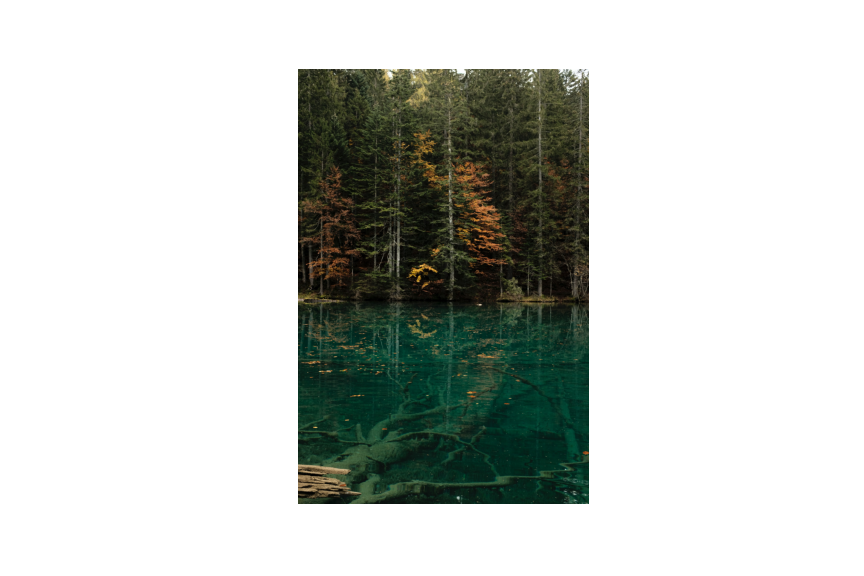

In [297]:
if use_interface:
    %matplotlib notebook
    import matplotlib.pyplot as plt
    bottom_center = utils.specify_bottom_center(background_img)

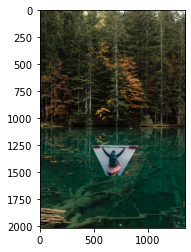

In [298]:
if use_interface:
    %matplotlib inline
    import matplotlib.pyplot as plt
    object_img, object_mask = utils.crop_object_img(object_img, object_mask)
    bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
    plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

## Part 2 Poisson Blending (50 pts)

In [299]:
def mask_dim(object_mask):
    """
    Given a mask, returns its dimensions. Adapted from utils.crop_object_img
    """
    ys, xs = np.where(object_mask == 1)
    h, w = object_mask.shape
    x1 = min(xs) - 1
    x2 = max(xs) + 1
    y1 = min(ys) - 1
    y2 = max(ys) + 1
    return y2 - y1, x2 - x1

def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    # Create a copy from the background image to be used as the target image
    mask_h, mask_w = object_mask.shape
    target_patch = bg_img[bg_ul[0]:bg_ul[0]+mask_h, bg_ul[1]:bg_ul[1]+mask_w].copy()
    # Create im2var corresponding to masked object (foreground) image
    nnz = (object_mask > 0).sum()
    im2var = -np.ones(object_img.shape[0:2], dtype='int32')
    im2var[object_mask > 0] = np.arange(nnz)
    
    mask_h, mask_w = mask_dim(object_mask)
    height, width = object_img.shape
    # Number of equations = number of pixels in mask * 2 + mask height + mask width
    neq = nnz * 2 + mask_h + mask_w
    A = scipy.sparse.lil_matrix((neq, nnz), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    e = 0
    
    for y in range(1, height-1):
        for x in range(1, width-1):
            # Pixel is within mask
            if im2var[y][x] > 0:
                # Right neighbor is within mask
                if im2var[y][x+1] > 0:
                    A[e, im2var[y][x]] = 1
                    A[e, im2var[y][x+1]] = -1
                    b[e] = object_img[y][x] - object_img[y][x+1]
                    e = e + 1
                # Right neighbor is not within mask
                else:
                    A[e, im2var[y][x]] = 1
                    b[e] = object_img[y][x] - object_img[y][x+1] + bg_img[bg_ul[0]+y][bg_ul[1]+x+1]
                    e = e + 1
                
                # Bottom neighbor is within mask
                if im2var[y+1][x] > 0:
                    A[e, im2var[y][x]] = 1
                    A[e, im2var[y+1][x]] = -1
                    b[e] = object_img[y][x] - object_img[y+1][x]
                    e = e + 1
                # Bottom neighbor is not within mask
                else:
                    A[e, im2var[y][x]] = 1
                    b[e] = object_img[y][x] - object_img[y+1][x] + bg_img[bg_ul[0]+y+1][bg_ul[1]+x]
                    e = e + 1
                    
                # Left neighbor is not within mask
                if im2var[y][x-1] < 0:
                    A[e, im2var[y][x]] = 1
                    b[e] = object_img[y][x] - object_img[y][x-1] + bg_img[bg_ul[0]+y][bg_ul[1]+x-1]
                    e = e + 1
                # Top neighbor is not within mask
                if im2var[y-1][x] < 0:
                    A[e, im2var[y][x]] = 1
                    b[e] = object_img[y][x] - object_img[y-1][x] + bg_img[bg_ul[0]+y-1][bg_ul[1]+x]
                    e = e + 1
            # Pixel is not within mask
            else:
                continue
    
    v = scipy.sparse.linalg.lsqr(A, b)[0]
    # Paste computed vector into masked region of target image
    target_patch[object_mask > 0] = v
    output = bg_img.copy()
    output[bg_ul[0]:bg_ul[0]+height, bg_ul[1]:bg_ul[1]+width] = target_patch
    
    return output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


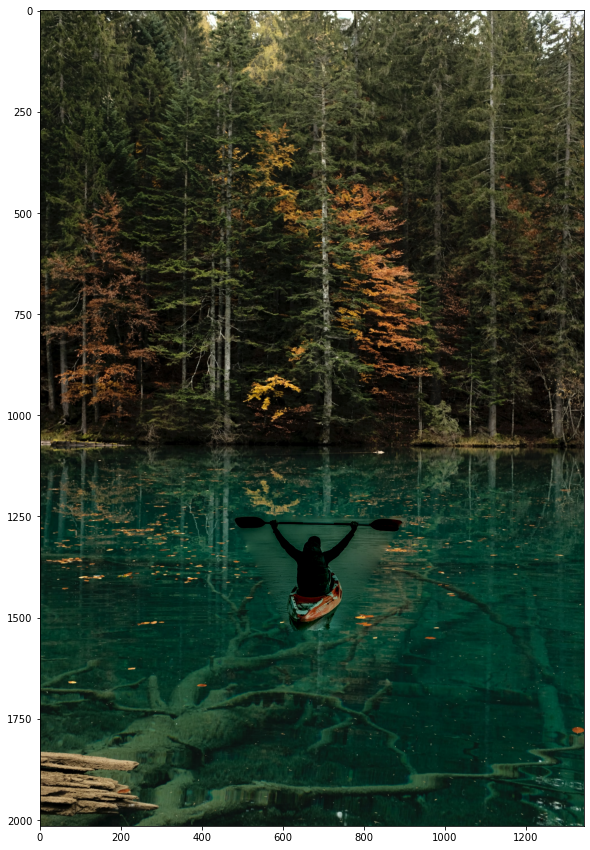

In [300]:
im_blend = np.zeros(background_img.shape)
# Leave data clipping to plt.imshow()
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)
plt.figure(figsize=(15,15))
plt.imshow(im_blend)

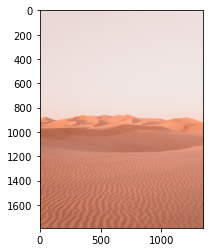

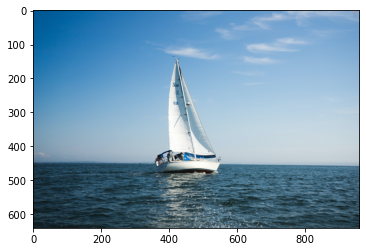

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


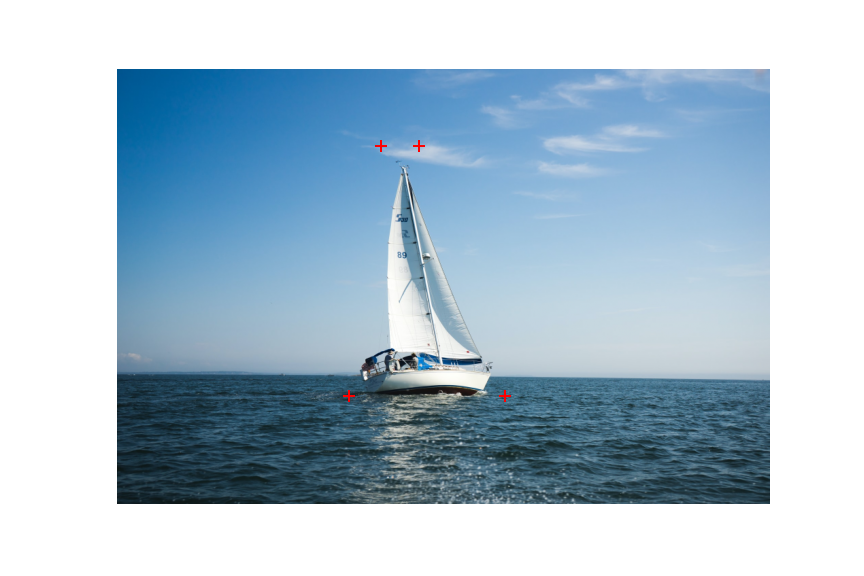

In [301]:
background_img_2 = cv2.cvtColor(cv2.imread('samples/pb_bg2.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
scale_h, scale_w = background_img_2.shape[:2]
scale_h = int(scale_h * 0.7)
scale_w = int(scale_w * 0.7)
background_img_2 = cv2.resize(background_img_2, (scale_w, scale_h))
plt.figure()
plt.imshow(background_img_2)
plt.show()
object_img_2 = cv2.cvtColor(cv2.imread('samples/pb_obj2.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
#scale_h, scale_w = object_img_2.shape[:2]
#scale_h = int(scale_h * 0.5)
#scale_w = int(scale_w * 0.5)
#object_img_2 = cv2.resize(object_img_2, (scale_w, scale_h))
plt.imshow(object_img_2)
plt.show()
if use_interface:
    import matplotlib.pyplot as plt
    %matplotlib notebook
    mask_coords = utils.specify_mask(object_img_2)

<Figure size 432x288 with 0 Axes>

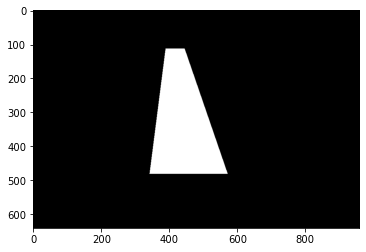

In [302]:
if use_interface:
    xs = mask_coords[0]
    ys = mask_coords[1]
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.figure()
    object_mask = utils.get_mask(ys, xs, object_img_2)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


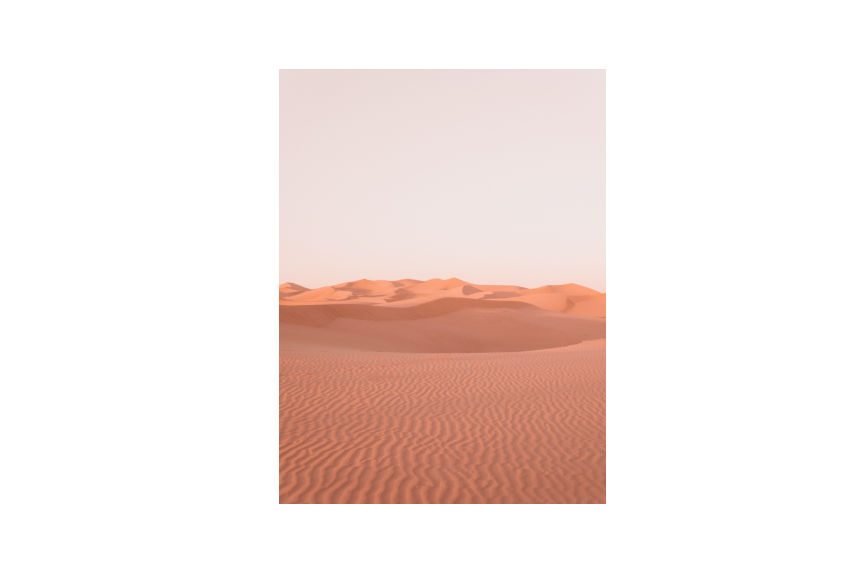

In [303]:
if use_interface:
    %matplotlib notebook
    import matplotlib.pyplot as plt
    bottom_center = utils.specify_bottom_center(background_img_2)

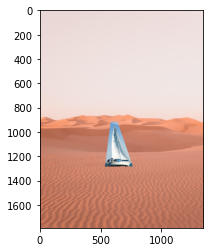

In [304]:
if use_interface:
    %matplotlib inline
    import matplotlib.pyplot as plt
    object_img_2, object_mask = utils.crop_object_img(object_img_2, object_mask)
    bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
    plt.imshow(utils.get_combined_img(background_img_2, object_img_2, object_mask, bg_ul))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


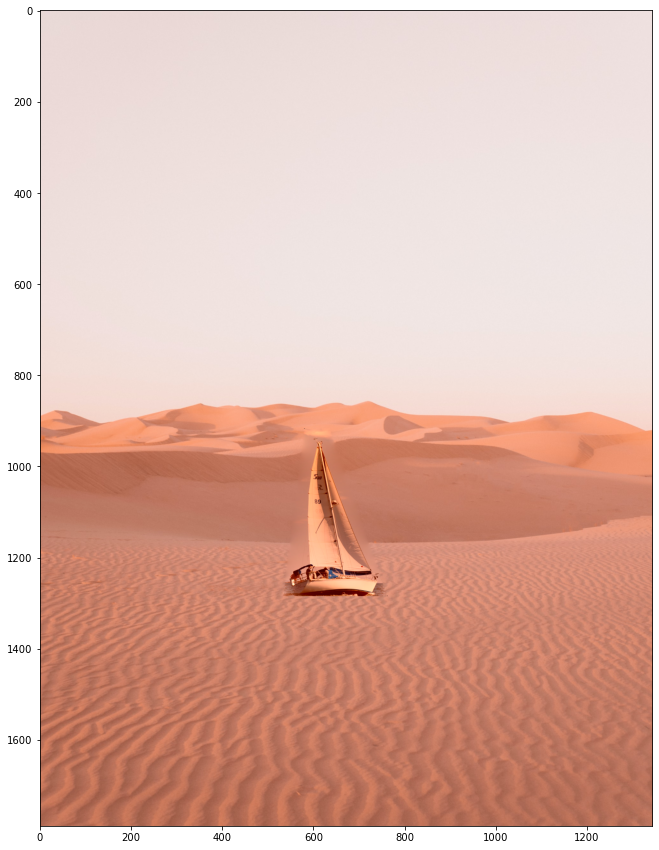

In [305]:
im_blend = np.zeros(background_img_2.shape)
# Leave data clipping to plt.imshow()
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img_2[:,:,b], object_mask, background_img_2[:,:,b].copy(), bg_ul)
plt.figure(figsize=(15,15))
plt.imshow(im_blend)

<IPython.core.display.Javascript object>


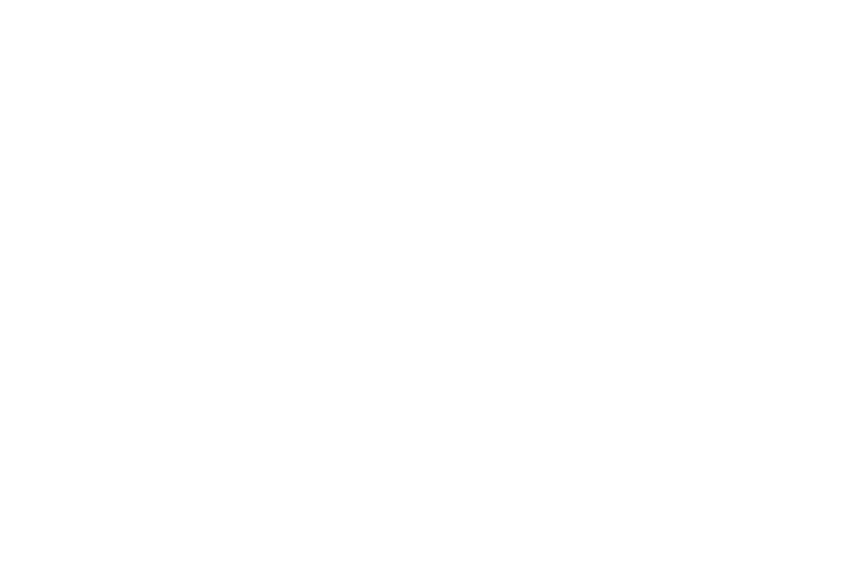

<IPython.core.display.Javascript object>


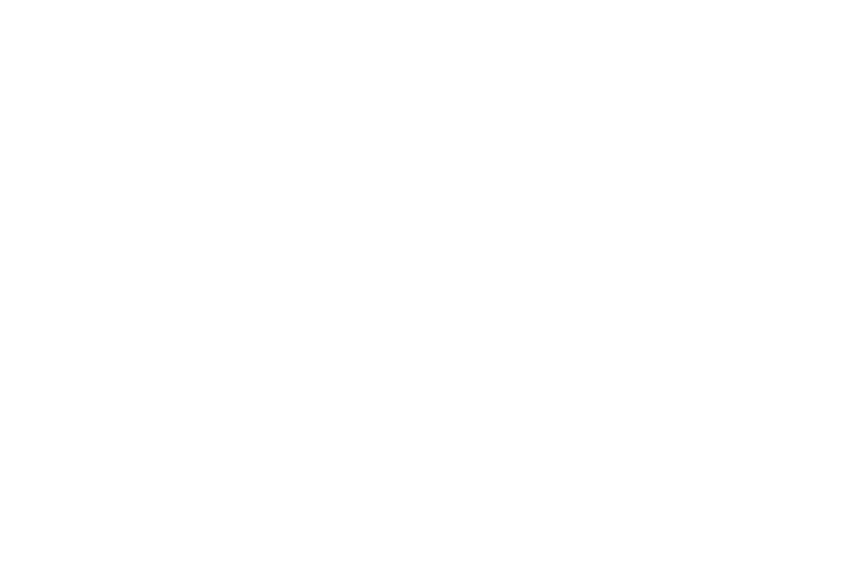

In [318]:
background_img_3 = cv2.cvtColor(cv2.imread('samples/pb_bg3.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
#scale_h, scale_w = background_img_3.shape[:2]
#scale_h = int(scale_h * 0.7)
#scale_w = int(scale_w * 0.7)
#background_img_3 = cv2.resize(background_img_3, (scale_w, scale_h))
plt.figure()
plt.imshow(background_img_3)
plt.show()
object_img_3 = cv2.cvtColor(cv2.imread('samples/pb_obj3.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
scale_h, scale_w = object_img_3.shape[:2]
scale_h = int(scale_h * 0.5)
scale_w = int(scale_w * 0.5)
object_img_3 = cv2.resize(object_img_3, (scale_w, scale_h))
plt.imshow(object_img_3)
plt.show()

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


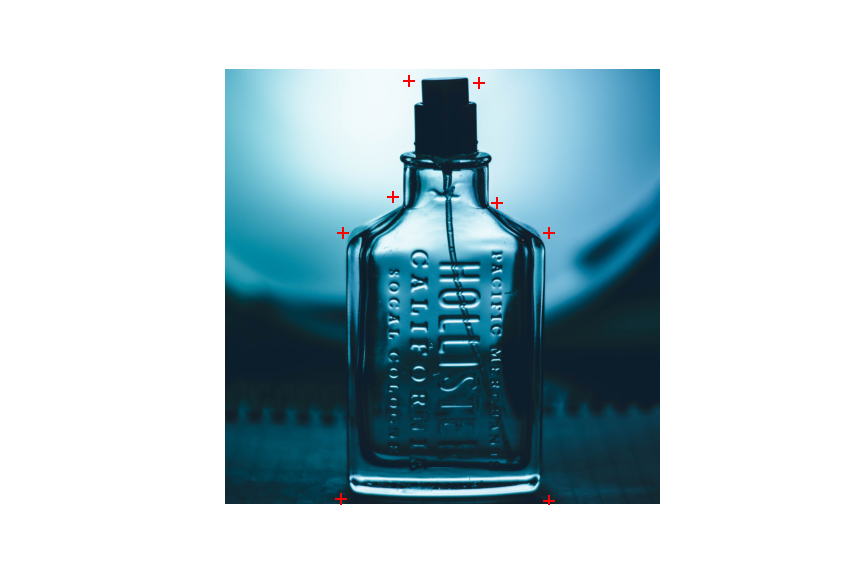

In [319]:
if use_interface:
    import matplotlib.pyplot as plt
    %matplotlib notebook
    mask_coords = utils.specify_mask(object_img_3)

<Figure size 432x288 with 0 Axes>

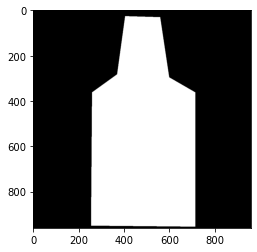

In [320]:
if use_interface:
    xs = mask_coords[0]
    ys = mask_coords[1]
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.figure()
    object_mask = utils.get_mask(ys, xs, object_img_3)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


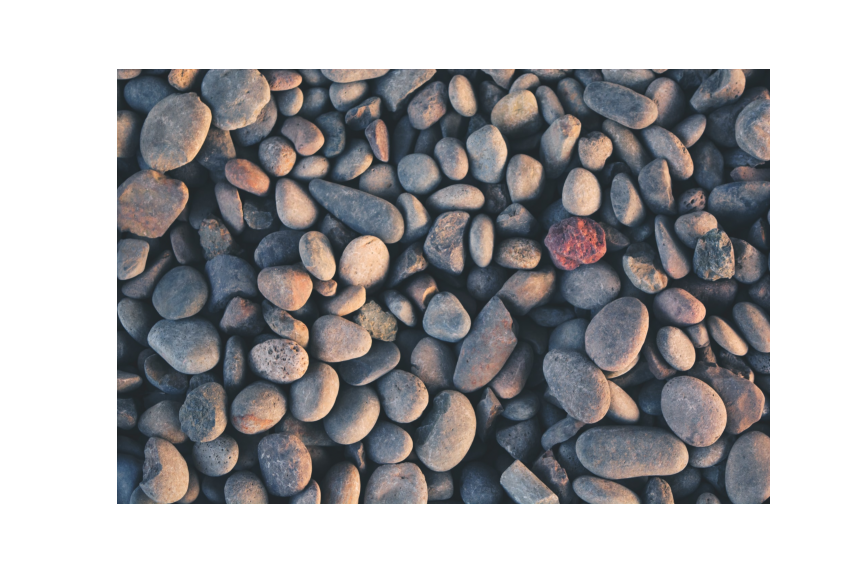

In [321]:
if use_interface:
    %matplotlib notebook
    import matplotlib.pyplot as plt
    bottom_center = utils.specify_bottom_center(background_img_3)

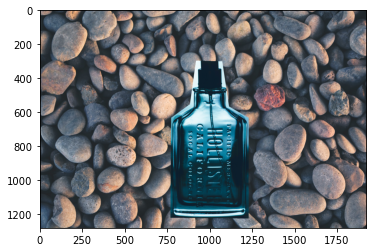

In [323]:
if use_interface:
    %matplotlib inline
    import matplotlib.pyplot as plt
    object_img_3, object_mask = utils.crop_object_img(object_img_3, object_mask)
    bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
    plt.imshow(utils.get_combined_img(background_img_3, object_img_3, object_mask, bg_ul))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


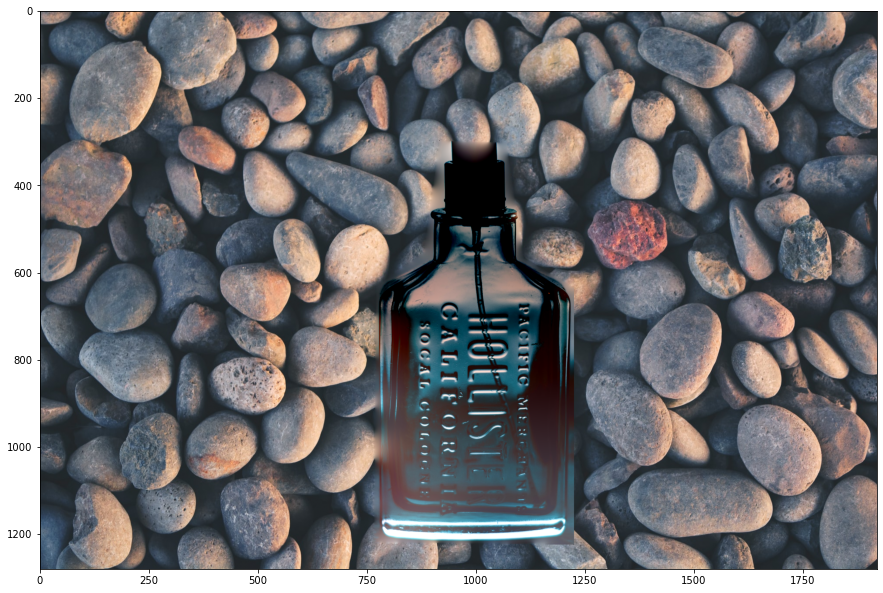

In [325]:
im_blend = np.zeros(background_img_3.shape)
# Leave data clipping to plt.imshow()
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img_3[:,:,b], object_mask, background_img_3[:,:,b].copy(), bg_ul)
plt.figure(figsize=(15,15))
plt.imshow(im_blend)

## Part 3 Mixed Gradients (20 pts)

In [140]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    # Create a copy from the background image to be used as the target image
    mask_h, mask_w = object_mask.shape
    target_patch = bg_img[bg_ul[0]:bg_ul[0]+mask_h, bg_ul[1]:bg_ul[1]+mask_w].copy()
    # Create im2var corresponding to masked object (foreground) image
    nnz = (object_mask > 0).sum()
    im2var = -np.ones(object_img.shape[0:2], dtype='int32')
    im2var[object_mask > 0] = np.arange(nnz)
    
    mask_h, mask_w = mask_dim(object_mask)
    height, width = object_img.shape
    # Number of equations = number of pixels in mask * 2 + mask height + mask width
    neq = nnz * 2 + mask_h + mask_w
    A = scipy.sparse.lil_matrix((neq, nnz), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    e = 0
    
    for y in range(1, height-1):
        for x in range(1, width-1):
            # Pixel is within mask
            if im2var[y][x] > 0:
                # Right neighbor is within mask
                if im2var[y][x+1] > 0:
                    A[e, im2var[y][x]] = 1
                    A[e, im2var[y][x+1]] = -1
                    # Source gradient
                    grad_s = object_img[y][x] - object_img[y][x+1]
                    # Target gradient
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y][bg_ul[1]+x+1]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = grad_s
                    else:
                        b[e] = grad_b
                    e = e + 1
                # Right neighbor is not within mask
                else:
                    A[e, im2var[y][x]] = 1
                    grad_s = object_img[y][x] - object_img[y][x+1]
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y][bg_ul[1]+x+1]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = bg_img[bg_ul[0]+y][bg_ul[1]+x+1] + grad_s
                    else:
                        b[e] = bg_img[bg_ul[0]+y][bg_ul[1]+x+1] + grad_b
                    e = e + 1
                
                # Bottom neighbor is within mask
                if im2var[y+1][x] > 0:
                    A[e, im2var[y][x]] = 1
                    A[e, im2var[y+1][x]] = -1
                    grad_s = object_img[y][x] - object_img[y+1][x]
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y+1][bg_ul[1]+x]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = grad_s
                    else:
                        b[e] = grad_b
                    e = e + 1
                # Bottom neighbor is not within mask
                else:
                    A[e, im2var[y][x]] = 1
                    grad_s = object_img[y][x] - object_img[y+1][x]
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y+1][bg_ul[1]+x]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = bg_img[bg_ul[0]+y+1][bg_ul[1]+x] + grad_s
                    else:
                        b[e] = bg_img[bg_ul[0]+y+1][bg_ul[1]+x] + grad_b
                    e = e + 1
                    
                # Left neighbor is not within mask
                if im2var[y][x-1] < 0:
                    A[e, im2var[y][x]] = 1
                    grad_s = object_img[y][x] - object_img[y][x-1]
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y][bg_ul[1]+x-1]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = bg_img[bg_ul[0]+y][bg_ul[1]+x-1] + grad_s
                    else:
                        b[e] = bg_img[bg_ul[0]+y][bg_ul[1]+x-1] + grad_b
                    e = e + 1
                # Top neighbor is not within mask
                if im2var[y-1][x] < 0:
                    A[e, im2var[y][x]] = 1
                    grad_s = object_img[y][x] - object_img[y-1][x]
                    grad_b = bg_img[bg_ul[0]+y][bg_ul[1]+x] - bg_img[bg_ul[0]+y-1][bg_ul[1]+x]
                    if np.abs(grad_s) > np.abs(grad_b):
                        b[e] = bg_img[bg_ul[0]+y-1][bg_ul[1]+x] + grad_s
                    else:
                        b[e] = bg_img[bg_ul[0]+y-1][bg_ul[1]+x] + grad_b
                    e = e + 1
            # Pixel is not within mask
            else:
                continue
    
    v = scipy.sparse.linalg.lsqr(A, b)[0]
    # Paste computed vector into masked region of target image
    target_patch[object_mask > 0] = v
    output = bg_img.copy()
    output[bg_ul[0]:bg_ul[0]+height, bg_ul[1]:bg_ul[1]+width] = target_patch
    
    return output

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


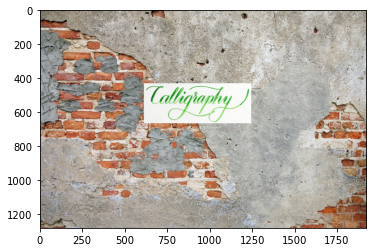

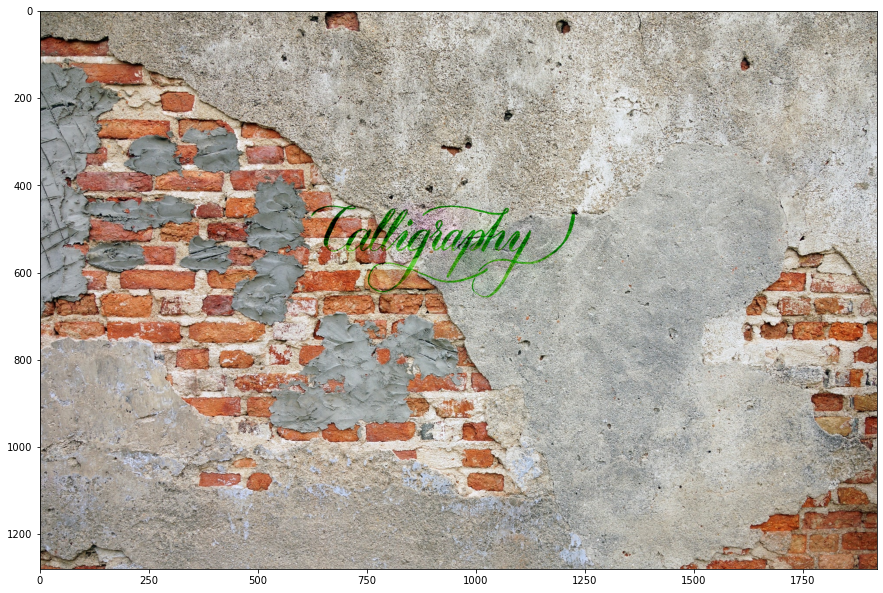

In [334]:
object_img_mg = cv2.cvtColor(cv2.imread('samples/mg_obj.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
background_img_mg = cv2.cvtColor(cv2.imread('samples/mg_bg.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
# Scale down new source image
scale_h, scale_w = object_img_mg.shape[:2]
scale_h = int(scale_h * 0.2)
scale_w = int(scale_w * 0.2)
object_img_mg = cv2.resize(object_img_mg, (scale_w, scale_h))
# Create image mask
xs_mg = (10, 640, 640, 10)
ys_mg = (30, 30, 265, 265)
object_mask_mg = utils.get_mask(ys_mg, xs_mg, object_img_mg)
bg_ul = [400, 600]
# Sanity check
plt.imshow(utils.get_combined_img(background_img_mg, object_img_mg, object_mask_mg, bg_ul))

im_mix = np.zeros(background_img_mg.shape)
# Leave data clipping to plt.imshow()
for b in np.arange(3):
    im_mix[:,:,b] = mixed_blend(object_img_mg[:,:,b], object_mask_mg, background_img_mg[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [4]:
def color2gray(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype('double') / 255.0
    img = img.astype('double') / 255.0
    height, width = img_gray.shape
    im2var = np.arange(height * width).reshape((height, width))
    # Number of equations = number of pixels in image * 2 + 1
    neq = height * width * 2 + 1
    A = scipy.sparse.lil_matrix((neq, height * width), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    e = 0
    
    # Intensity from greyscale image (single pixel)
    A[e, im2var[0][0]] = 1
    b[e] = img_gray[0][0]
    
    for y in range(height):
        for x in range(width):
            # Gradient of colored image
            if x != width-1:
                e = e + 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                red = img[y][x+1][0] - img[y][x][0]
                green = img[y][x+1][1] - img[y][x][1]
                blue = img[y][x+1][2] - img[y][x][2]
                max_grad = max([red, green, blue], key=abs)
                b[e] = max_grad
                
            if y != height-1:
                e = e + 1
                A[e, im2var[y+1][x]] = 1
                A[e, im2var[y][x]] = -1
                red = img[y+1][x][0] - img[y][x][0]
                green = img[y+1][x][1] - img[y][x][1]
                blue = img[y+1][x][2] - img[y][x][2]
                max_grad = max([red, green, blue], key=abs)
                b[e] = max_grad

    v = scipy.sparse.linalg.lsqr(A, b)
    
    return v[0].reshape(height, width)

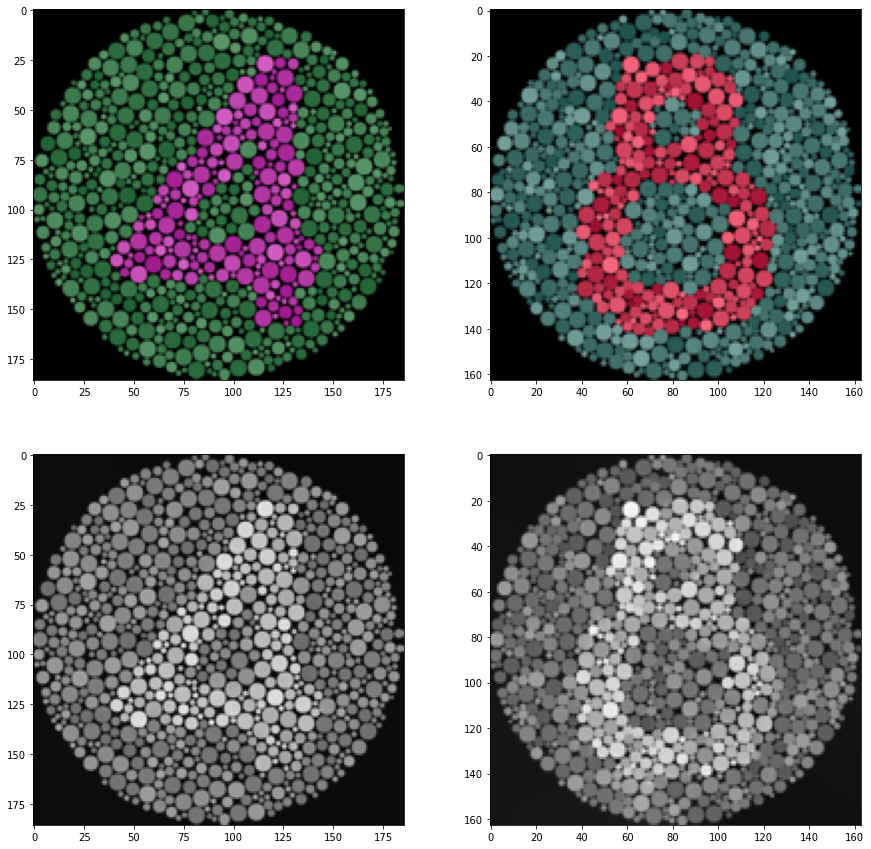

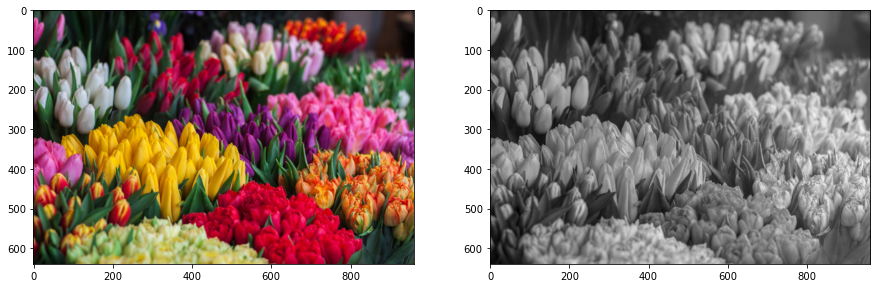

In [7]:
color_8 = cv2.cvtColor(cv2.imread('samples/colorBlind8.png'), cv2.COLOR_BGR2RGB)
color_4 = cv2.cvtColor(cv2.imread('samples/colorBlind4.png'), cv2.COLOR_BGR2RGB)
c2g = cv2.cvtColor(cv2.imread('samples/c2g.jpg'), cv2.COLOR_BGR2RGB)
scale_h, scale_w = c2g.shape[:2]
scale_h = int(scale_h * 0.5)
scale_w = int(scale_w * 0.5)
c2g = cv2.resize(c2g, (scale_w, scale_h))

#color_4_out = color2gray(color_4)
#color_8_out = color2gray(color_8)
#c2g_out = color2gray(c2g)

pt, ax = plt.subplots(2, 2, figsize=(15, 15))
ax[0][0].imshow(color_4)
ax[0][1].imshow(color_8)
ax[1][0].imshow(color_4_out, cmap='gray')
ax[1][1].imshow(color_8_out, cmap='gray')

pt, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].imshow(c2g)
ax[1].imshow(c2g_out, cmap='gray')

## Laplacian pyramid blending (20 pts)

In [ ]:
def laplacian_blend(object_img, object_mask, bg_img, bg_ul):
  # feel free to change input parameters
    pass

## More gradient domain processing (up to 20 pts)